In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import altair as alt

#use ggplot-like theme in the entire notebook and set the figure size
plt.style.use('ggplot')
plt.rcParams["figure.figsize"]=(10,6)

#import the final dataset
final_results = pd.read_csv('marathon_clean.csv', sep=',')


final_results.head()

,Name,Age_group,Number,Time,First_half,Second_half,Pace_0_5,Pace_5_10,Pace_10_15,Pace_15_20,...,Pace_0_5_sec,Pace_5_10_sec,Pace_10_15_sec,Pace_15_20_sec,Pace_20_21_sec,Pace_21_25_sec,Pace_25_30_sec,Pace_30_35_sec,Pace_35_40_sec,Pace_40_42_sec
0,"Adola, Guye",M30,2,02:05:45,01:00:48,01:04:58,02:53,02:53,02:53,02:53,...,173,173,173,173,174,183,182,185,192,181
1,"Bekele, Kenenisa",M35,1,02:06:47,01:01:00,01:05:47,02:53,02:53,02:53,02:56,...,173,173,173,176,175,181,181,185,199,193
2,"Abate, Tadu",MH,6,02:08:24,01:02:15,01:06:10,03:00,02:57,02:58,02:56,...,180,177,178,176,174,178,184,191,196,193
3,"Legese, Demiso",MH,22,02:12:35,01:02:48,01:09:48,03:00,02:57,02:58,03:00,...,180,177,178,180,184,186,189,195,215,217
4,"Kiros, Ashenafi",MH,62,02:22:41,01:09:19,01:13:23,03:18,03:19,03:18,03:15,...,198,199,198,195,194,197,197,200,216,264


Let's start with the analysis of the results.

We have used this number throughout the dataset building, but let's show once more how many runners completed the race:

In [5]:
len(final_results)

23102

Now compare the number of finishers by gender and depict that on a graph

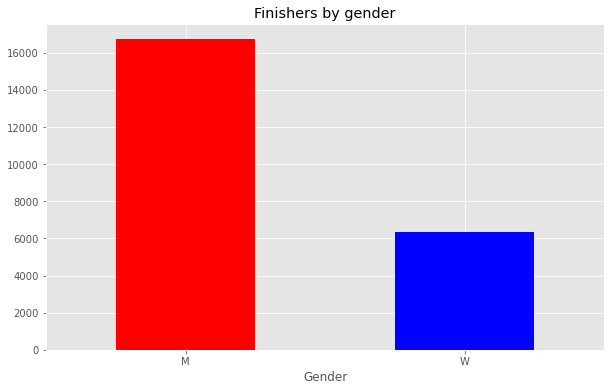

In [6]:
final_results.groupby(['Gender'])['Gender'].count().plot.bar(rot = 0, title = "Finishers by gender",  color=['red', 'blue'])

Same for age categories (this might seem logical to be do it on a histogram, but remember, we have categories, not continuous age!!)

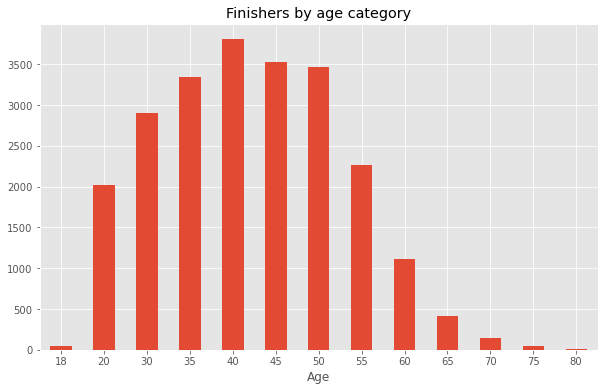

In [7]:
final_results.groupby(['Age'])['Age'].count().plot.bar(rot = 0, title = "Finishers by age category")

Have a look at how many countries were represented in a race:

In [8]:
final_results['Country'].nunique()

131

Let's depict top 15 of them on a graph again:

Text(0.5, 0, 'Country')

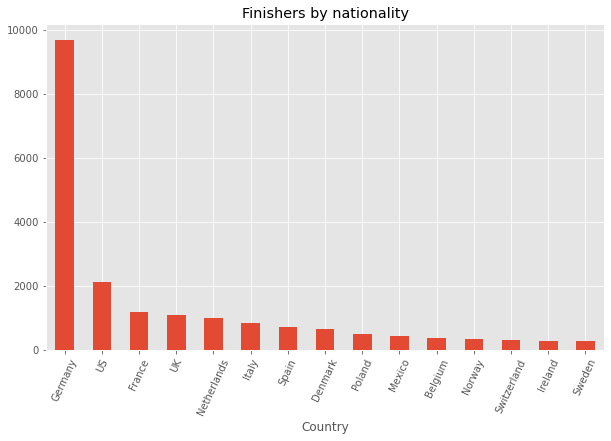

In [9]:
final_results.groupby(['Country_long'])['Country_long'].count().sort_values(ascending = False).head(15).plot.bar(rot = 65, title = "Finishers by nationality")
plt.xlabel("Country")

And the Czech Republic?

In [10]:
len(final_results.loc[final_results['Country_long'] == 'Czechia'])

46

Now that we have summed the number of finishers, let's analyze the what everybody aims at - their time.

From now on, we will be working with the time in minutes.

First, what was the average finishing time:

In [11]:
final_results['Time_mins'].mean()

257.43923469829576

257 minutes - that means 4 hours and 17 minutes...

Let's divide it by gender:

In [12]:
final_results.groupby(["Gender"])['Time_mins'].mean()

Gender
M    250.194837
W    276.480383
Name: Time_mins, dtype: float64

That means, women were on average slower by 26 minutes.

But we can have a look at the distribution of the finishing times.

Text(0.5, 0, 'Finish time - minutes')

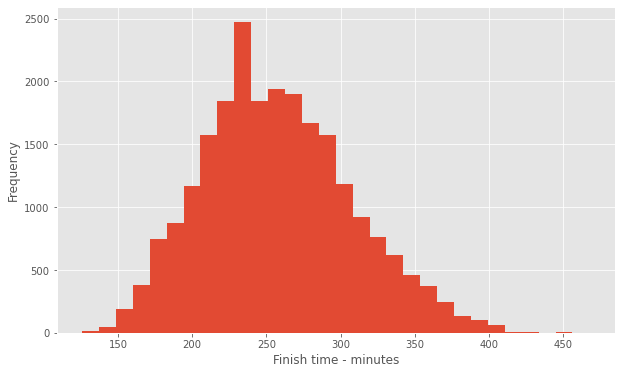

In [13]:
final_results['Time_mins'].plot.hist(bins = 30)
plt.xlabel("Finish time - minutes")

As expected, the distribution of finishing times is slightly skewed to the right, logically, since the time below 2 hours, is borderline impossible, also there was a time limit of 6 hours to finish.

What is interesting, we can observe a peak slightly below 240 minutes - it seems that for many runners the 4 hours is the ultimate goal. We have a pretty large dataset, so let's try to break the histogram into more bins and see if the same thing (although not to that large extent) applies for other "round" times - full hours or half hours.

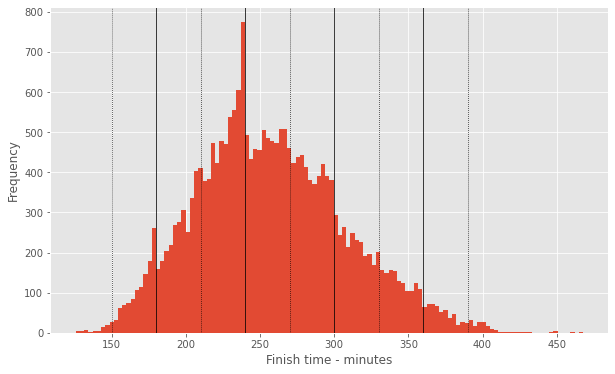

In [14]:
final_results['Time_mins'].plot.hist(bins = 120)
plt.xlabel("Finish time - minutes")

##add some vertical lines depict the full hours and half-hours
#we make the solid line at each full hour (starting at 3 hours, nobody got under 2 hours)
full_hours = range(180,420, 60)
for x_full in full_hours:
    plt.axvline(x = x_full, color = "black", linewidth = 0.75)
#dotted line at each half hour (that is not full hour), we can try to start at 150 minutes     
half_hours = range(150,450, 60)
for x_half in half_hours:
    plt.axvline(x = x_half, color = "black", linewidth = 0.75, linestyle = "dotted")



Indeed, there's a notable difference number of finishers below/above each full hour barrier. For half-hours that it is not that notable, similar "small peaks" occur elsewhere throughout the graph.

And let's analyse the time by the age group, it is observed, that the peak age might be around 25-35, that means that the fastest category (as would presented on the second graph) would be 20-30 or 30-35.

Boxplots are more conveniently done using seaborn package, let's use this package instead of matplotlib this time. 

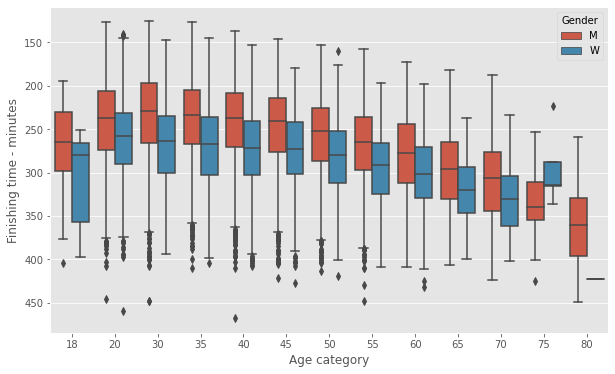

In [15]:
sns.boxplot(x=final_results['Age'], y=final_results['Time_mins'], hue=final_results['Gender'])
plt.gca().invert_yaxis() #the y-axis is inverted such that the better times are at the top
plt.ylabel("Finishing time - minutes")
plt.xlabel("Age category")
plt.show()

Fastest men were in the category of 30-35, women in the younger category. Yet another interesting thing is that a major drop in performance can be seen after 50, even though the whiskers of the boxplot do not go that high - those are the elite athletes.

Just out of curiosity, let's make the comparison by countries. We need to make some pre-selection - there were 131 nationalities, some countries had just couple of runners and some (like Kenya or Ethiopia) just a few elites so their times are incomperable to the crowd of runners. So we can use the selection of the countries with the most runners (as above) and add Czechia (with 46 runners)

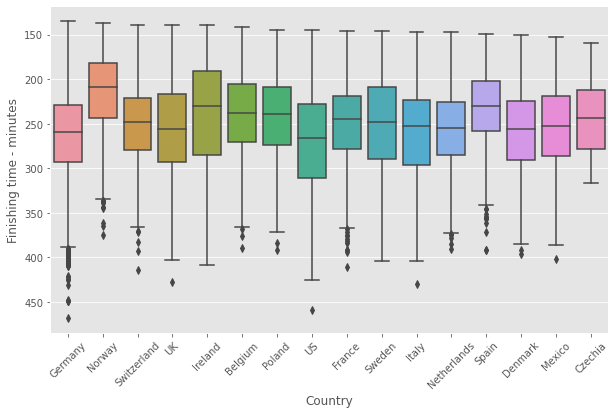

In [16]:
#get the list of countries with highest participation, add Czechia
top_countries = final_results.groupby(['Country_long'])['Country_long'].count().sort_values(ascending = False).head(15).index.tolist()
top_countries.append('Czechia')
#filter for runners from those countries
final_results_c = final_results[final_results['Country_long'].isin(top_countries)]

sns.boxplot(x=final_results_c['Country_long'], y=final_results_c['Time_mins'])
plt.gca().invert_yaxis() #the y-axis is inverted such that the better times are at the top
plt.ylabel("Finishing time - minutes")
plt.xlabel("Country")
plt.xticks(rotation=45)
plt.show()

                                

Next, we get inspired by the paper from Smith (2018) (available [here](https://content.iospress.com/articles/journal-of-sports-analytics/jsa205), which investigates how the too fast pace at the start of the race negatively affects the finishing times. 

We state the following hypotheses: 
- Fasters runners would have more even pace (experienced runners are well trained and can hold the pace over the whole course)
- women have more even pace (this had been found in the Smith's paper)

We investigate this using linear regression. The comparison of the pace is assesed this way - we calculate the percentage difference between average pace on kilometers 0 to 5 and 35 - 40 (this is chosen because runners might tend to use "last bits of energy" and speed up on the last kilometer and finish line, that is why we don't use the 40-42 segment(note: paces are reported every 5 kilometers); also the Berlin marathon is known for its flat course, thus there is no bias comparing flat and hilly segment of the course). Alternatively, we compare ratio of time in the first and second half of the race.

As predictors we use the finishing time, gender and also we will try to add the age group.

And finally we create a dashboard, where every runner can see his pace throughout the whole race (by 5 km segments again (with an exception of 20th-21st km and the last two km). 

In [4]:
#load the dataset created in the Cleaner notebook
pace_table = pd.read_csv('pace_table.csv', sep=',')

Note: For the first runner, the software uses whole range of values to set the scale of the axis: **change to any other runner in the dropdown list**.

In [19]:

alt.data_transformers.disable_max_rows()


runners_list = list(pace_table['Name'].unique())

input_dropdown = alt.binding_select(options=runners_list)
selection = alt.selection_single(fields=['Name'], bind=input_dropdown, name='Name')

alt_plot = alt.Chart(pace_table).mark_line().encode(
    x=alt.X('Km', scale=alt.Scale(zero=False, padding = 0, nice = False)),
    y=alt.Y('Pace:Q', title = 'Pace - seconds per km', scale=alt.Scale(zero=False, padding = 1)),
    tooltip='Pace'
).add_selection(
    selection
).transform_filter(
    selection
)


alt_plot

alt.Chart(...)